In [4]:
pip install lime shap

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


# Random Forest

In [3]:
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import LabelEncoder

# Load the dataset
dataset_path = r'D:\CIC-APT-IIOT-2024_CIC-DarkNet-2020_Analysis\CIC-APT-IIoT-2024_dataset.csv'
df = pd.read_csv(dataset_path)

# Fill NaN values if present in categorical columns
df.fillna('unknown', inplace=True)

# Encode categorical columns (Source IP, Destination IP, Protocol_name)
categorical_columns = ['Source IP', 'Destination IP', 'Protocol_name']
le = LabelEncoder()

for col in categorical_columns:
    df[col] = le.fit_transform(df[col])

# Define feature columns and target column
# Exclude non-numeric and irrelevant columns (like IPs or sequence numbers if not relevant)
features = ['flow_duration', 'Header_Length', 'Source Port', 'Destination Port', 'Protocol Type', 'Duration', 
            'Rate', 'Srate', 'Drate', 'fin_flag_number', 'syn_flag_number', 'rst_flag_number', 'psh_flag_number', 
            'ack_flag_number', 'urg_flag_number', 'ece_flag_number', 'cwr_flag_number', 'ack_count', 'syn_count', 
            'fin_count', 'urg_count', 'rst_count', 'max_duration', 'min_duration', 'sum_duration', 'average_duration', 
            'std_duration', 'CoAP', 'HTTP', 'HTTPS', 'DNS', 'Telnet', 'SMTP', 'SSH', 'IRC', 'TCP', 'UDP', 'DHCP', 
            'ARP', 'ICMP', 'IGMP', 'IPv', 'LLC', 'Tot sum', 'Min', 'Max', 'AVG', 'Std', 'Tot size', 'IAT', 'Number', 
            'MAC', 'Magnitue', 'Radius', 'Covariance', 'Variance', 'Weight', 'DS status', 'Fragments', 'Sequence number', 
            'Protocol Version', 'flow_idle_time', 'flow_active_time'] 

# Target column
target = 'is_mal'

# Split the data into training and testing sets
X = df[features]
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the Random Forest model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)

# Train the model
rf_model.fit(X_train, y_train)

# Predict on the test data
y_pred = rf_model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print(f"Accuracy: {accuracy:.4f}")
print("Classification Report:")
print(report)


C:\Users\sathw\AppData\Local\Temp\ipykernel_24984\711611707.py:9: DtypeWarning: Columns (68,69) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(dataset_path)


Accuracy: 1.0000
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     10073
           1       1.00      1.00      1.00     19927

    accuracy                           1.00     30000
   macro avg       1.00      1.00      1.00     30000
weighted avg       1.00      1.00      1.00     30000



AssertionError: The shape of the shap_values matrix does not match the shape of the provided data matrix.

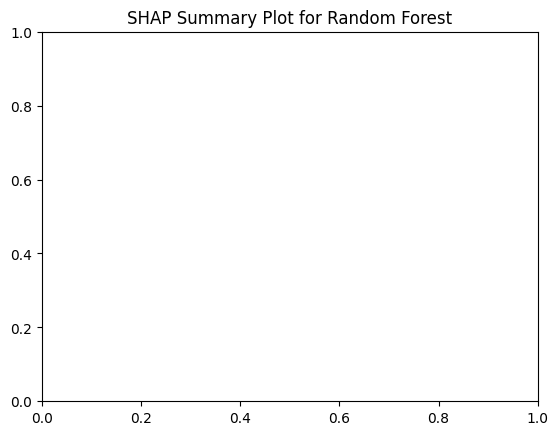

In [5]:
import shap
import matplotlib.pyplot as plt

# Initialize SHAP explainer
explainer = shap.TreeExplainer(rf_model)

# Calculate SHAP values for the test set
shap_values = explainer.shap_values(X_test)

# Visualize the SHAP summary plot for the predictions
# For binary classification, shap_values[0] and shap_values[1] correspond to the two classes
# Assuming shap_values[1] is for the positive class (e.g., malicious)
plt.title("SHAP Summary Plot for Random Forest")
shap.summary_plot(shap_values[1], X_test, feature_names=X_test.columns)

# SHAP dependence plot for a specific feature
# Ensure the feature name matches exactly with a column in X_test
plt.title("SHAP Dependence Plot for 'flow_duration'")
shap.dependence_plot("flow_duration", shap_values[1], X_test, feature_names=X_test.columns)

# SHAP force plot for a single prediction (e.g., the first prediction in the test set)
# Force plots require a Jupyter notebook or a supported environment
sample_index = 0
shap.initjs()  # Required to render the force plot in Jupyter
shap.force_plot(explainer.expected_value[1], shap_values[1][sample_index, :], X_test.iloc[sample_index])


In [5]:
from sklearn.model_selection import cross_val_score

# Perform 3-fold cross-validation
cv_scores = cross_val_score(rf_model, X, y, cv=3, scoring='accuracy')

# Calculate mean and standard deviation of cross-validation scores
cv_mean = cv_scores.mean()
cv_std = cv_scores.std()

print(f"3-Fold Cross-Validation Results:")
print(f"Mean Accuracy: {cv_mean:.4f}")
print(f"Standard Deviation: {cv_std:.4f}")

3-Fold Cross-Validation Results:
Mean Accuracy: 1.0000
Standard Deviation: 0.0000


In [31]:
# Re-importing necessary libraries and re-defining the required code due to state reset.
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.preprocessing import LabelEncoder
import shap
from lime.lime_tabular import LimeTabularExplainer
import joblib
import os
import matplotlib.pyplot as plt

# Load the dataset
dataset_path = r'D:\CIC-APT-IIOT-2024_CIC-DarkNet-2020_Analysis\CIC-APT-IIoT-2024_dataset.csv'
df = pd.read_csv(dataset_path)

# Fill NaN values if present in categorical columns
df.fillna('unknown', inplace=True)

# Encode categorical columns (Source IP, Destination IP, Protocol_name)
categorical_columns = ['Source IP', 'Destination IP', 'Protocol_name']
le = LabelEncoder()

for col in categorical_columns:
    df[col] = le.fit_transform(df[col])

# Define feature columns and target column
features = ['flow_duration', 'Header_Length', 'Source Port', 'Destination Port', 'Protocol Type', 'Duration', 
            'Rate', 'Srate', 'Drate', 'fin_flag_number', 'syn_flag_number', 'rst_flag_number', 'psh_flag_number', 
            'ack_flag_number', 'urg_flag_number', 'ece_flag_number', 'cwr_flag_number', 'ack_count', 'syn_count', 
            'fin_count', 'urg_count', 'rst_count', 'max_duration', 'min_duration', 'sum_duration', 'average_duration', 
            'std_duration', 'CoAP', 'HTTP', 'HTTPS', 'DNS', 'Telnet', 'SMTP', 'SSH', 'IRC', 'TCP', 'UDP', 'DHCP', 
            'ARP', 'ICMP', 'IGMP', 'IPv', 'LLC', 'Tot sum', 'Min', 'Max', 'AVG', 'Std', 'Tot size', 'IAT', 'Number', 
            'MAC', 'Magnitue', 'Radius', 'Covariance', 'Variance', 'Weight', 'DS status', 'Fragments', 'Sequence number', 
            'Protocol Version', 'flow_idle_time', 'flow_active_time'] 

# Target column
target = 'is_mal'

# Split the data into training and testing sets
X = df[features]
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the Random Forest model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)

# Train the model
rf_model.fit(X_train, y_train)

# Predict on the test data
y_pred = rf_model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

# 1. Calculate Model Size
model_file = "rf_model.joblib"
joblib.dump(rf_model, model_file)
model_size = os.path.getsize(model_file) / 1024  # Size in KB

# 2. Count Number of Parameters (for RandomForest, it's the total number of splits)
n_parameters = sum(estimator.tree_.node_count for estimator in rf_model.estimators_)

# 4. Apply LIME
lime_explainer = LimeTabularExplainer(
    X_train.values,
    feature_names=features,
    class_names=['Not Malicious', 'Malicious'],
    discretize_continuous=True,
)

# Display LIME explanation for the first test instance
lime_exp = lime_explainer.explain_instance(
    X_test.iloc[0].values, rf_model.predict_proba, num_features=10
)
lime_exp.show_in_notebook()

# Results
model_size, n_parameters

C:\Users\sathw\AppData\Local\Temp\ipykernel_16200\3253712394.py:15: DtypeWarning: Columns (68,69) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(dataset_path)
c:\Users\sathw\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


(419.8212890625, 4860)

<Figure size 800x600 with 0 Axes>

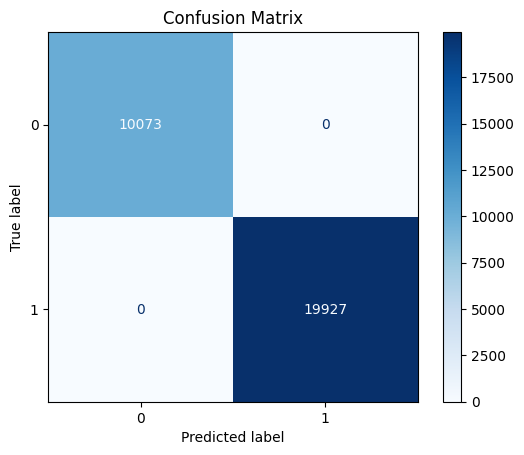

In [32]:
# 3. Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=rf_model.classes_)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
disp.plot(cmap=plt.cm.Blues, values_format='d')
plt.title("Confusion Matrix")
plt.show()


# SVM

In [14]:
import pandas as pd
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler

# Load the dataset
dataset_path = r'D:\CIC-APT-IIOT-2024_CIC-DarkNet-2020_Analysis\CIC-APT-IIoT-2024_dataset.csv'
df = pd.read_csv(dataset_path)

# Fill NaN values if present in categorical columns
df.fillna('unknown', inplace=True)

# Encode categorical columns (Source IP, Destination IP, Protocol_name)
categorical_columns = ['Source IP', 'Destination IP', 'Protocol_name']
le = LabelEncoder()

for col in categorical_columns:
    df[col] = le.fit_transform(df[col])

# Define feature columns and target column
# Exclude non-numeric and irrelevant columns (like IPs or sequence numbers if not relevant)
features = ['flow_duration', 'Header_Length', 'Source Port', 'Destination Port', 'Protocol Type', 'Duration', 
            'Rate', 'Srate', 'Drate', 'fin_flag_number', 'syn_flag_number', 'rst_flag_number', 'psh_flag_number', 
            'ack_flag_number', 'urg_flag_number', 'ece_flag_number', 'cwr_flag_number', 'ack_count', 'syn_count', 
            'fin_count', 'urg_count', 'rst_count', 'max_duration', 'min_duration', 'sum_duration', 'average_duration', 
            'std_duration', 'CoAP', 'HTTP', 'HTTPS', 'DNS', 'Telnet', 'SMTP', 'SSH', 'IRC', 'TCP', 'UDP', 'DHCP', 
            'ARP', 'ICMP', 'IGMP', 'IPv', 'LLC', 'Tot sum', 'Min', 'Max', 'AVG', 'Std', 'Tot size', 'IAT', 'Number', 
            'MAC', 'Magnitue', 'Radius', 'Covariance', 'Variance', 'Weight', 'DS status', 'Fragments', 'Sequence number', 
            'Protocol Version', 'flow_idle_time', 'flow_active_time']  # Add all other numeric features

# Target column
target = 'is_mal'

# Split the data into training and testing sets
X = df[features]
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features (SVM requires feature scaling)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Initialize the SVM model
svm_model = SVC(kernel='rbf', random_state=42)

# Train the model
svm_model.fit(X_train, y_train)

# Predict on the test data
y_pred = svm_model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print(f"Accuracy: {accuracy:.4f}")
print("Classification Report:")
print(report)


C:\Users\sathw\AppData\Local\Temp\ipykernel_16200\1073249523.py:10: DtypeWarning: Columns (68,69) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(dataset_path)


Accuracy: 0.9998
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     10073
           1       1.00      1.00      1.00     19927

    accuracy                           1.00     30000
   macro avg       1.00      1.00      1.00     30000
weighted avg       1.00      1.00      1.00     30000



In [29]:
import pandas as pd
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.preprocessing import LabelEncoder, StandardScaler
import matplotlib.pyplot as plt
import joblib
from lime.lime_tabular import LimeTabularExplainer

# Load the dataset
dataset_path = r'D:\CIC-APT-IIOT-2024_CIC-DarkNet-2020_Analysis\CIC-APT-IIoT-2024_dataset.csv'
df = pd.read_csv(dataset_path)

# Fill NaN values if present in categorical columns
df.fillna('unknown', inplace=True)

# Encode categorical columns (Source IP, Destination IP, Protocol_name)
categorical_columns = ['Source IP', 'Destination IP', 'Protocol_name']
le = LabelEncoder()

for col in categorical_columns:
    df[col] = le.fit_transform(df[col])

# Define feature columns and target column
features = ['flow_duration', 'Header_Length', 'Source Port', 'Destination Port', 'Protocol Type', 'Duration', 
            'Rate', 'Srate', 'Drate', 'fin_flag_number', 'syn_flag_number', 'rst_flag_number', 'psh_flag_number', 
            'ack_flag_number', 'urg_flag_number', 'ece_flag_number', 'cwr_flag_number', 'ack_count', 'syn_count', 
            'fin_count', 'urg_count', 'rst_count', 'max_duration', 'min_duration', 'sum_duration', 'average_duration', 
            'std_duration', 'CoAP', 'HTTP', 'HTTPS', 'DNS', 'Telnet', 'SMTP', 'SSH', 'IRC', 'TCP', 'UDP', 'DHCP', 
            'ARP', 'ICMP', 'IGMP', 'IPv', 'LLC', 'Tot sum', 'Min', 'Max', 'AVG', 'Std', 'Tot size', 'IAT', 'Number', 
            'MAC', 'Magnitue', 'Radius', 'Covariance', 'Variance', 'Weight', 'DS status', 'Fragments', 'Sequence number', 
            'Protocol Version', 'flow_idle_time', 'flow_active_time']

target = 'is_mal'

# Split the data into training and testing sets
X = df[features]
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features (SVM requires feature scaling)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Initialize the SVM model
svm_model = SVC(kernel='rbf', probability=True, random_state=42)

# Train the model
svm_model.fit(X_train, y_train)

# Predict on the test data
y_pred = svm_model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

# Save the model size
model_file = "svm_model.joblib"
joblib.dump(svm_model, model_file)
model_size = os.path.getsize(model_file) / 1024  # Size in KB


# Apply LIME
lime_explainer = LimeTabularExplainer(
    X_train,
    feature_names=features,
    class_names=['Not Malicious', 'Malicious'],
    discretize_continuous=True,
)

# Display LIME explanation for the first test instance
lime_exp = lime_explainer.explain_instance(
    X_test[0], svm_model.predict_proba, num_features=10
)
lime_exp.show_in_notebook()

# Results
accuracy, model_size

C:\Users\sathw\AppData\Local\Temp\ipykernel_16200\3208328258.py:12: DtypeWarning: Columns (68,69) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(dataset_path)


(0.9998333333333334, 252.9013671875)

<Figure size 800x600 with 0 Axes>

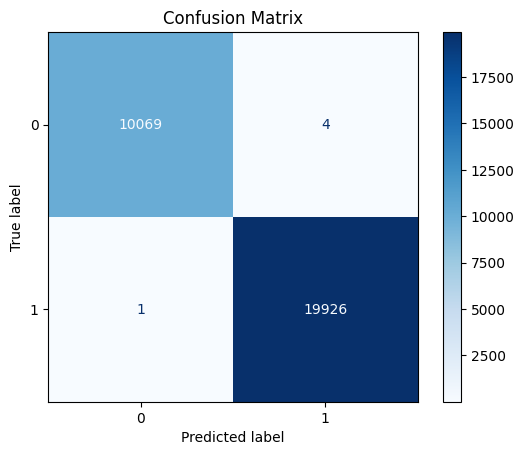

In [30]:
# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=svm_model.classes_)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
disp.plot(cmap=plt.cm.Blues, values_format='d')
plt.title("Confusion Matrix")
plt.show()


# XG Boost

In [6]:
import pandas as pd
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler

# Load the dataset
dataset_path = r'D:\CIC-APT-IIOT-2024_CIC-DarkNet-2020_Analysis\CIC-APT-IIoT-2024_dataset.csv'
df = pd.read_csv(dataset_path)

# Fill NaN values if present in categorical columns
df.fillna('unknown', inplace=True)

# Encode categorical columns (Source IP, Destination IP, Protocol_name)
categorical_columns = ['Source IP', 'Destination IP', 'Protocol_name']
le = LabelEncoder()

for col in categorical_columns:
    df[col] = le.fit_transform(df[col])

# Define feature columns and target column
# Exclude non-numeric and irrelevant columns (like IPs or sequence numbers if not relevant)
features = ['flow_duration', 'Header_Length', 'Source Port', 'Destination Port', 'Protocol Type', 'Duration', 
            'Rate', 'Srate', 'Drate', 'fin_flag_number', 'syn_flag_number', 'rst_flag_number', 'psh_flag_number', 
            'ack_flag_number', 'urg_flag_number', 'ece_flag_number', 'cwr_flag_number', 'ack_count', 'syn_count', 
            'fin_count', 'urg_count', 'rst_count', 'max_duration', 'min_duration', 'sum_duration', 'average_duration', 
            'std_duration', 'CoAP', 'HTTP', 'HTTPS', 'DNS', 'Telnet', 'SMTP', 'SSH', 'IRC', 'TCP', 'UDP', 'DHCP', 
            'ARP', 'ICMP', 'IGMP', 'IPv', 'LLC', 'Tot sum', 'Min', 'Max', 'AVG', 'Std', 'Tot size', 'IAT', 'Number', 
            'MAC', 'Magnitue', 'Radius', 'Covariance', 'Variance', 'Weight', 'DS status', 'Fragments', 'Sequence number', 
            'Protocol Version', 'flow_idle_time', 'flow_active_time']  # Add all other numeric features

# Target column
target = 'is_mal'

# Split the data into training and testing sets
X = df[features]
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Initialize the XGBoost model
xgb_model = XGBClassifier(n_estimators=100, learning_rate=0.1, random_state=42, use_label_encoder=False, eval_metric='mlogloss')

# Train the model
xgb_model.fit(X_train, y_train)

# Predict on the test data
y_pred = xgb_model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print(f"Accuracy: {accuracy:.4f}")
print("Classification Report:")
print(report)

C:\Users\sathw\AppData\Local\Temp\ipykernel_24984\1739246369.py:10: DtypeWarning: Columns (68,69) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(dataset_path)
c:\Users\sathw\AppData\Local\Programs\Python\Python310\lib\site-packages\xgboost\core.py:158: UserWarning: [15:27:54] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0c55ff5f71b100e98-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Accuracy: 1.0000
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     10073
           1       1.00      1.00      1.00     19927

    accuracy                           1.00     30000
   macro avg       1.00      1.00      1.00     30000
weighted avg       1.00      1.00      1.00     30000



In [15]:
print("\n=== SHAP Contributions for Test Samples ===")
for i in range(n_samples_to_explain):
    # Get the prediction for the current test sample
    predicted_value = ensemble_predict_for_shap(X_test_subset[i:i + 1])[0]
    
    # If predicted_value is an array, extract the scalar value
    if isinstance(predicted_value, np.ndarray):
        predicted_value = predicted_value[0]  # Assuming binary classification; adjust for multi-class

    print(f"Test sample {i}, predicted = {predicted_value:.4f}")

    # Ensure SHAP values are scalars
    for feat_name, val in zip(features, shap_values[i]):
        val_scalar = val if np.isscalar(val) else val.item()  # Convert to scalar if needed
        print(f"  {feat_name}: {val_scalar:.4f}")



=== SHAP Contributions for Test Samples ===
Test sample 0, predicted = 1.0000


ValueError: can only convert an array of size 1 to a Python scalar

In [27]:
# Importing necessary libraries for XGBoost evaluation and analysis
import pandas as pd
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.preprocessing import LabelEncoder, StandardScaler
import shap
from lime.lime_tabular import LimeTabularExplainer
import joblib
import os
import matplotlib.pyplot as plt

# Load the dataset
dataset_path = r'D:\CIC-APT-IIOT-2024_CIC-DarkNet-2020_Analysis\CIC-APT-IIoT-2024_dataset.csv'
df = pd.read_csv(dataset_path)

# Fill NaN values if present in categorical columns
df.fillna('unknown', inplace=True)

# Encode categorical columns (Source IP, Destination IP, Protocol_name)
categorical_columns = ['Source IP', 'Destination IP', 'Protocol_name']
le = LabelEncoder()

for col in categorical_columns:
    df[col] = le.fit_transform(df[col])

# Define feature columns and target column
features = ['flow_duration', 'Header_Length', 'Source Port', 'Destination Port', 'Protocol Type', 'Duration', 
            'Rate', 'Srate', 'Drate', 'fin_flag_number', 'syn_flag_number', 'rst_flag_number', 'psh_flag_number', 
            'ack_flag_number', 'urg_flag_number', 'ece_flag_number', 'cwr_flag_number', 'ack_count', 'syn_count', 
            'fin_count', 'urg_count', 'rst_count', 'max_duration', 'min_duration', 'sum_duration', 'average_duration', 
            'std_duration', 'CoAP', 'HTTP', 'HTTPS', 'DNS', 'Telnet', 'SMTP', 'SSH', 'IRC', 'TCP', 'UDP', 'DHCP', 
            'ARP', 'ICMP', 'IGMP', 'IPv', 'LLC', 'Tot sum', 'Min', 'Max', 'AVG', 'Std', 'Tot size', 'IAT', 'Number', 
            'MAC', 'Magnitue', 'Radius', 'Covariance', 'Variance', 'Weight', 'DS status', 'Fragments', 'Sequence number', 
            'Protocol Version', 'flow_idle_time', 'flow_active_time']

# Target column
target = 'is_mal'

# Split the data into training and testing sets
X = df[features]
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Initialize the XGBoost model
xgb_model = XGBClassifier(n_estimators=100, learning_rate=0.1, random_state=42, use_label_encoder=False, eval_metric='mlogloss')

# Train the model
xgb_model.fit(X_train, y_train)

# Predict on the test data
y_pred = xgb_model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

# 1. Calculate Model Size
model_file_xgb = "xgb_model.joblib"
joblib.dump(xgb_model, model_file_xgb)
model_size_xgb = os.path.getsize(model_file_xgb) / 1024  # Size in KB


# 3. Apply LIME
lime_explainer_xgb = LimeTabularExplainer(
    X_train,
    feature_names=features,
    class_names=['Not Malicious', 'Malicious'],
    discretize_continuous=True,
)

# Display LIME explanation for the first test instance
lime_exp_xgb = lime_explainer_xgb.explain_instance(
    X_test[0], xgb_model.predict_proba, num_features=10
)
lime_exp_xgb.show_in_notebook()

# 4. Apply SHAP
shap_explainer_xgb = shap.TreeExplainer(xgb_model)
shap_values_xgb = shap_explainer_xgb.shap_values(X_test)

print("----------------------------------------------------")

# Results
accuracy, report, model_size_xgb

C:\Users\sathw\AppData\Local\Temp\ipykernel_16200\3786422688.py:15: DtypeWarning: Columns (68,69) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(dataset_path)
c:\Users\sathw\AppData\Local\Programs\Python\Python310\lib\site-packages\xgboost\core.py:158: UserWarning: [13:33:43] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0c55ff5f71b100e98-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


----------------------------------------------------


(1.0,
 '              precision    recall  f1-score   support\n\n           0       1.00      1.00      1.00     10073\n           1       1.00      1.00      1.00     19927\n\n    accuracy                           1.00     30000\n   macro avg       1.00      1.00      1.00     30000\nweighted avg       1.00      1.00      1.00     30000\n',
 78.1103515625)

<Figure size 800x600 with 0 Axes>

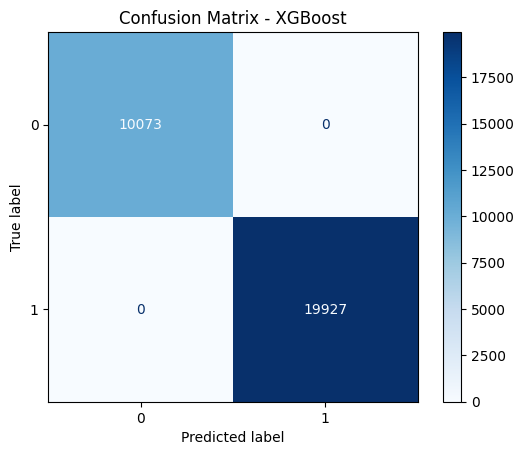

In [28]:
# 2. Confusion Matrix
conf_matrix_xgb = confusion_matrix(y_test, y_pred)
disp_xgb = ConfusionMatrixDisplay(confusion_matrix=conf_matrix_xgb, display_labels=xgb_model.classes_)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
disp_xgb.plot(cmap=plt.cm.Blues, values_format='d')
plt.title("Confusion Matrix - XGBoost")
plt.show()

# Adaboost

In [21]:
import pandas as pd
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier

# Load the dataset
dataset_path = r'D:\CIC-APT-IIOT-2024_CIC-DarkNet-2020_Analysis\CIC-APT-IIoT-2024_dataset.csv'
df = pd.read_csv(dataset_path)

# Fill NaN values if present in categorical columns
df.fillna('unknown', inplace=True)

# Encode categorical columns (Source IP, Destination IP, Protocol_name)
categorical_columns = ['Source IP', 'Destination IP', 'Protocol_name']
le = LabelEncoder()

for col in categorical_columns:
    df[col] = le.fit_transform(df[col])

# Define feature columns and target column
# Exclude non-numeric and irrelevant columns (like IPs or sequence numbers if not relevant)
features = ['flow_duration', 'Header_Length', 'Source Port', 'Destination Port', 'Protocol Type', 'Duration', 
            'Rate', 'Srate', 'Drate', 'fin_flag_number', 'syn_flag_number', 'rst_flag_number', 'psh_flag_number', 
            'ack_flag_number', 'urg_flag_number', 'ece_flag_number', 'cwr_flag_number', 'ack_count', 'syn_count', 
            'fin_count', 'urg_count', 'rst_count', 'max_duration', 'min_duration', 'sum_duration', 'average_duration', 
            'std_duration', 'CoAP', 'HTTP', 'HTTPS', 'DNS', 'Telnet', 'SMTP', 'SSH', 'IRC', 'TCP', 'UDP', 'DHCP', 
            'ARP', 'ICMP', 'IGMP', 'IPv', 'LLC', 'Tot sum', 'Min', 'Max', 'AVG', 'Std', 'Tot size', 'IAT', 'Number', 
            'MAC', 'Magnitue', 'Radius', 'Covariance', 'Variance', 'Weight', 'DS status', 'Fragments', 'Sequence number', 
            'Protocol Version', 'flow_idle_time', 'flow_active_time']  # Add all other numeric features

# Target column
target = 'is_mal'

# Split the data into training and testing sets
X = df[features]
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features (AdaBoost doesn't require scaling but it may help with performance)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Initialize the AdaBoost model
# Using a DecisionTreeClassifier as the base estimator
estimator = DecisionTreeClassifier(max_depth=1, random_state=42)
ada_model = AdaBoostClassifier(estimator=estimator, n_estimators=100, learning_rate=0.1, random_state=42)

# Train the model
ada_model.fit(X_train, y_train)

# Predict on the test data
y_pred = ada_model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print(f"Accuracy: {accuracy:.4f}")
print("Classification Report:")
print(report)


C:\Users\sathw\AppData\Local\Temp\ipykernel_16200\2214277523.py:11: DtypeWarning: Columns (68,69) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(dataset_path)


Accuracy: 1.0000
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     10073
           1       1.00      1.00      1.00     19927

    accuracy                           1.00     30000
   macro avg       1.00      1.00      1.00     30000
weighted avg       1.00      1.00      1.00     30000



In [25]:
import pandas as pd
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.tree import DecisionTreeClassifier
import joblib
import os
import shap
from lime.lime_tabular import LimeTabularExplainer
import matplotlib.pyplot as plt

# Load the dataset
dataset_path = r'D:\CIC-APT-IIOT-2024_CIC-DarkNet-2020_Analysis\CIC-APT-IIoT-2024_dataset.csv'
df = pd.read_csv(dataset_path)

# Fill NaN values if present in categorical columns
df.fillna('unknown', inplace=True)

# Encode categorical columns (Source IP, Destination IP, Protocol_name)
categorical_columns = ['Source IP', 'Destination IP', 'Protocol_name']
le = LabelEncoder()
for col in categorical_columns:
    df[col] = le.fit_transform(df[col])

# Define feature columns and target column
features = ['flow_duration', 'Header_Length', 'Source Port', 'Destination Port', 'Protocol Type', 'Duration',
            'Rate', 'Srate', 'Drate', 'fin_flag_number', 'syn_flag_number', 'rst_flag_number', 'psh_flag_number',
            'ack_flag_number', 'urg_flag_number', 'ece_flag_number', 'cwr_flag_number', 'ack_count', 'syn_count',
            'fin_count', 'urg_count', 'rst_count', 'max_duration', 'min_duration', 'sum_duration', 'average_duration',
            'std_duration', 'CoAP', 'HTTP', 'HTTPS', 'DNS', 'Telnet', 'SMTP', 'SSH', 'IRC', 'TCP', 'UDP', 'DHCP',
            'ARP', 'ICMP', 'IGMP', 'IPv', 'LLC', 'Tot sum', 'Min', 'Max', 'AVG', 'Std', 'Tot size', 'IAT', 'Number',
            'MAC', 'Magnitue', 'Radius', 'Covariance', 'Variance', 'Weight', 'DS status', 'Fragments', 'Sequence number',
            'Protocol Version', 'flow_idle_time', 'flow_active_time']

# Target column
target = 'is_mal'

# Split the data into training and testing sets
X = df[features]
y = df[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Initialize the AdaBoost model
estimator = DecisionTreeClassifier(max_depth=1, random_state=42)
ada_model = AdaBoostClassifier(estimator=estimator, n_estimators=100, learning_rate=0.1, random_state=42)

# Train the model
ada_model.fit(X_train, y_train)

# Predict on the test data
y_pred = ada_model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)
print(f"Accuracy: {accuracy:.4f}")
print("Classification Report:")
print(report)

# 1. Model size
model_file = "ada_model.joblib"
joblib.dump(ada_model, model_file)
model_size = os.path.getsize(model_file) / 1024  # Size in KB

# 2. Number of parameters (number of estimators in AdaBoost)
n_parameters = len(ada_model.estimators_)

# 4. Apply LIME
lime_explainer = LimeTabularExplainer(
    X_train,
    feature_names=features,
    class_names=['Not Malicious', 'Malicious'],
    discretize_continuous=True,
)
lime_exp = lime_explainer.explain_instance(
    X_test[0], ada_model.predict_proba, num_features=10
)
lime_exp.show_in_notebook()


# Results
model_size, n_parameters

C:\Users\sathw\AppData\Local\Temp\ipykernel_16200\3914336460.py:15: DtypeWarning: Columns (68,69) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(dataset_path)


Accuracy: 1.0000
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     10073
           1       1.00      1.00      1.00     19927

    accuracy                           1.00     30000
   macro avg       1.00      1.00      1.00     30000
weighted avg       1.00      1.00      1.00     30000



(3.55078125, 1)

<Figure size 800x600 with 0 Axes>

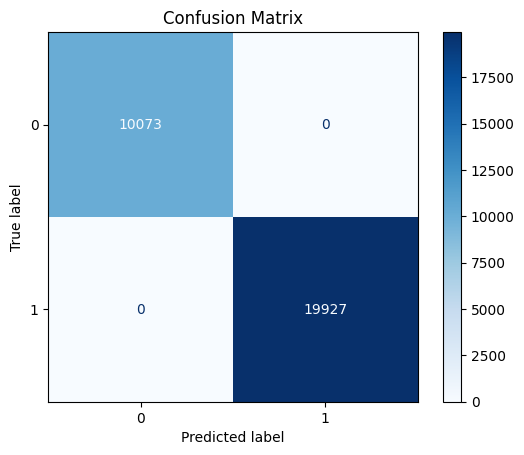

In [26]:
# 3. Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=ada_model.classes_)
plt.figure(figsize=(8, 6))
disp.plot(cmap=plt.cm.Blues, values_format='d')
plt.title("Confusion Matrix")
plt.show()

# Logistic Regression

In [33]:
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler

# Load the dataset
dataset_path = r'D:\CIC-APT-IIOT-2024_CIC-DarkNet-2020_Analysis\CIC-APT-IIoT-2024_dataset.csv'
df = pd.read_csv(dataset_path)

# Fill NaN values if present in categorical columns
df.fillna('unknown', inplace=True)

# Encode categorical columns (Source IP, Destination IP, Protocol_name)
categorical_columns = ['Source IP', 'Destination IP', 'Protocol_name']
le = LabelEncoder()

for col in categorical_columns:
    df[col] = le.fit_transform(df[col])

# Define feature columns and target column
# Exclude non-numeric and irrelevant columns (like IPs or sequence numbers if not relevant)
features = ['flow_duration', 'Header_Length', 'Source Port', 'Destination Port', 'Protocol Type', 'Duration', 
            'Rate', 'Srate', 'Drate', 'fin_flag_number', 'syn_flag_number', 'rst_flag_number', 'psh_flag_number', 
            'ack_flag_number', 'urg_flag_number', 'ece_flag_number', 'cwr_flag_number', 'ack_count', 'syn_count', 
            'fin_count', 'urg_count', 'rst_count', 'max_duration', 'min_duration', 'sum_duration', 'average_duration', 
            'std_duration', 'CoAP', 'HTTP', 'HTTPS', 'DNS', 'Telnet', 'SMTP', 'SSH', 'IRC', 'TCP', 'UDP', 'DHCP', 
            'ARP', 'ICMP', 'IGMP', 'IPv', 'LLC', 'Tot sum', 'Min', 'Max', 'AVG', 'Std', 'Tot size', 'IAT', 'Number', 
            'MAC', 'Magnitue', 'Radius', 'Covariance', 'Variance', 'Weight', 'DS status', 'Fragments', 'Sequence number', 
            'Protocol Version', 'flow_idle_time', 'flow_active_time']  # Add all other numeric features

# Target column
target = 'is_mal'

# Split the data into training and testing sets
X = df[features]
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features (Logistic Regression performs better with standardized features)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Initialize the Logistic Regression model
logistic_model = LogisticRegression(random_state=42, max_iter=1000)

# Train the model
logistic_model.fit(X_train, y_train)

# Predict on the test data
y_pred = logistic_model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print(f"Accuracy: {accuracy:.4f}")
print("Classification Report:")
print(report)


C:\Users\sathw\AppData\Local\Temp\ipykernel_16200\3148917109.py:10: DtypeWarning: Columns (68,69) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(dataset_path)


Accuracy: 1.0000
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     10073
           1       1.00      1.00      1.00     19927

    accuracy                           1.00     30000
   macro avg       1.00      1.00      1.00     30000
weighted avg       1.00      1.00      1.00     30000



In [45]:
# Import necessary libraries
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.preprocessing import LabelEncoder, StandardScaler
from lime.lime_tabular import LimeTabularExplainer
import joblib
import os
import matplotlib.pyplot as plt

# Load the dataset
dataset_path = r'D:\CIC-APT-IIOT-2024_CIC-DarkNet-2020_Analysis\CIC-APT-IIoT-2024_dataset.csv'
df = pd.read_csv(dataset_path)

# Fill NaN values if present in categorical columns
df.fillna('unknown', inplace=True)

# Encode categorical columns (Source IP, Destination IP, Protocol_name)
categorical_columns = ['Source IP', 'Destination IP', 'Protocol_name']
le = LabelEncoder()

for col in categorical_columns:
    df[col] = le.fit_transform(df[col])

# Define feature columns and target column
features = ['flow_duration', 'Header_Length', 'Source Port', 'Destination Port', 'Protocol Type', 'Duration', 
            'Rate', 'Srate', 'Drate', 'fin_flag_number', 'syn_flag_number', 'rst_flag_number', 'psh_flag_number', 
            'ack_flag_number', 'urg_flag_number', 'ece_flag_number', 'cwr_flag_number', 'ack_count', 'syn_count', 
            'fin_count', 'urg_count', 'rst_count', 'max_duration', 'min_duration', 'sum_duration', 'average_duration', 
            'std_duration', 'CoAP', 'HTTP', 'HTTPS', 'DNS', 'Telnet', 'SMTP', 'SSH', 'IRC', 'TCP', 'UDP', 'DHCP', 
            'ARP', 'ICMP', 'IGMP', 'IPv', 'LLC', 'Tot sum', 'Min', 'Max', 'AVG', 'Std', 'Tot size', 'IAT', 'Number', 
            'MAC', 'Magnitue', 'Radius', 'Covariance', 'Variance', 'Weight', 'DS status', 'Fragments', 'Sequence number', 
            'Protocol Version', 'flow_idle_time', 'flow_active_time']  # Add all other numeric features

target = 'is_mal'

# Split the data into training and testing sets
X = df[features]
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Initialize the Logistic Regression model
logistic_model = LogisticRegression(random_state=42, max_iter=1000)

# Train the model
logistic_model.fit(X_train, y_train)

# Predict on the test data
y_pred = logistic_model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

# Save and calculate the model size
model_file = "logistic_model.joblib"
joblib.dump(logistic_model, model_file)
model_size = os.path.getsize(model_file) / 1024  # Size in KB
# Apply LIME
lime_explainer = LimeTabularExplainer(
    X_train,
    feature_names=features,
    class_names=['Not Malicious', 'Malicious'],
    discretize_continuous=True,
)

# Display LIME explanation for the first test instance
lime_exp = lime_explainer.explain_instance(
    X_test[0], logistic_model.predict_proba, num_features=10
)
lime_exp.show_in_notebook()

# Results
model_size, accuracy

C:\Users\sathw\AppData\Local\Temp\ipykernel_16200\3726374546.py:14: DtypeWarning: Columns (68,69) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(dataset_path)


(1.3427734375, 1.0)

<Figure size 800x600 with 0 Axes>

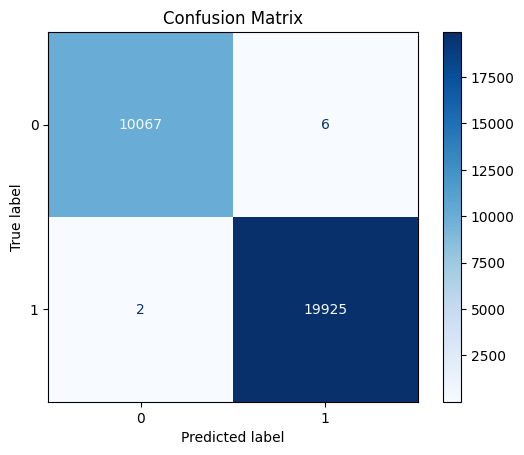

In [44]:
# Plot confusion matrix
plt.figure(figsize=(8, 6))
disp.plot(cmap=plt.cm.Blues, values_format='d')
plt.title("Confusion Matrix")
plt.show()

# Linear Regression

In [36]:
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler

# Load the dataset
dataset_path = r'D:\CIC-APT-IIOT-2024_CIC-DarkNet-2020_Analysis\CIC-APT-IIoT-2024_dataset.csv'
df = pd.read_csv(dataset_path)

# Fill NaN values if present in categorical columns
df.fillna('unknown', inplace=True)

# Encode categorical columns (Source IP, Destination IP, Protocol_name)
categorical_columns = ['Source IP', 'Destination IP', 'Protocol_name']
le = LabelEncoder()

for col in categorical_columns:
    df[col] = le.fit_transform(df[col])

# Define feature columns and target column
# Exclude non-numeric and irrelevant columns (like IPs or sequence numbers if not relevant)
features = ['flow_duration', 'Header_Length', 'Source Port', 'Destination Port', 'Protocol Type', 'Duration', 
            'Rate', 'Srate', 'Drate', 'fin_flag_number', 'syn_flag_number', 'rst_flag_number', 'psh_flag_number', 
            'ack_flag_number', 'urg_flag_number', 'ece_flag_number', 'cwr_flag_number', 'ack_count', 'syn_count', 
            'fin_count', 'urg_count', 'rst_count', 'max_duration', 'min_duration', 'sum_duration', 'average_duration', 
            'std_duration', 'CoAP', 'HTTP', 'HTTPS', 'DNS', 'Telnet', 'SMTP', 'SSH', 'IRC', 'TCP', 'UDP', 'DHCP', 
            'ARP', 'ICMP', 'IGMP', 'IPv', 'LLC', 'Tot sum', 'Min', 'Max', 'AVG', 'Std', 'Tot size', 'IAT', 'Number', 
            'MAC', 'Magnitue', 'Radius', 'Covariance', 'Variance', 'Weight', 'DS status', 'Fragments', 'Sequence number', 
            'Protocol Version', 'flow_idle_time', 'flow_active_time']  # Add all other numeric features

# Target column
target = 'is_mal'  # Make sure 'is_mal' is continuous if this is for regression

# Split the data into training and testing sets
X = df[features]
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features (Linear Regression performs better with standardized features)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Initialize the Linear Regression model
linear_model = LinearRegression()

# Train the model
linear_model.fit(X_train, y_train)

# Predict on the test data
y_pred = linear_model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"R² Score: {r2:.4f}")


C:\Users\sathw\AppData\Local\Temp\ipykernel_16200\3637523535.py:10: DtypeWarning: Columns (68,69) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(dataset_path)


Mean Squared Error (MSE): 0.0120
R² Score: 0.9463


In [38]:
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.preprocessing import LabelEncoder, StandardScaler
import joblib
import matplotlib.pyplot as plt
from lime.lime_tabular import LimeTabularExplainer

# Load the dataset
dataset_path = r'D:\CIC-APT-IIOT-2024_CIC-DarkNet-2020_Analysis\CIC-APT-IIoT-2024_dataset.csv'
df = pd.read_csv(dataset_path)

# Fill NaN values if present in categorical columns
df.fillna('unknown', inplace=True)

# Encode categorical columns (Source IP, Destination IP, Protocol_name)
categorical_columns = ['Source IP', 'Destination IP', 'Protocol_name']
le = LabelEncoder()

for col in categorical_columns:
    df[col] = le.fit_transform(df[col])

# Define feature columns and target column
features = ['flow_duration', 'Header_Length', 'Source Port', 'Destination Port', 'Protocol Type', 'Duration', 
            'Rate', 'Srate', 'Drate', 'fin_flag_number', 'syn_flag_number', 'rst_flag_number', 'psh_flag_number', 
            'ack_flag_number', 'urg_flag_number', 'ece_flag_number', 'cwr_flag_number', 'ack_count', 'syn_count', 
            'fin_count', 'urg_count', 'rst_count', 'max_duration', 'min_duration', 'sum_duration', 'average_duration', 
            'std_duration', 'CoAP', 'HTTP', 'HTTPS', 'DNS', 'Telnet', 'SMTP', 'SSH', 'IRC', 'TCP', 'UDP', 'DHCP', 
            'ARP', 'ICMP', 'IGMP', 'IPv', 'LLC', 'Tot sum', 'Min', 'Max', 'AVG', 'Std', 'Tot size', 'IAT', 'Number', 
            'MAC', 'Magnitue', 'Radius', 'Covariance', 'Variance', 'Weight', 'DS status', 'Fragments', 'Sequence number', 
            'Protocol Version', 'flow_idle_time', 'flow_active_time']  # Add all other numeric features

# Target column
target = 'is_mal'  # Ensure 'is_mal' is continuous for regression

# Split the data into training and testing sets
X = df[features]
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Initialize the Linear Regression model
linear_model = LinearRegression()

# Train the model
linear_model.fit(X_train, y_train)

# Predict on the test data
y_pred = linear_model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"R² Score: {r2:.4f}")

# 1. Calculate Model Size
model_file = "linear_model.joblib"
joblib.dump(linear_model, model_file)
model_size = os.path.getsize(model_file) / 1024  # Size in KB

# 2. Count Number of Parameters
n_parameters = linear_model.coef_.shape[0] + 1  # Coefficients + intercept


# 4. Apply LIME
lime_explainer = LimeTabularExplainer(
    X_train,
    feature_names=features,
    class_names=['Target'],
    discretize_continuous=True,
)


# Results
print(f"Model Size (KB): {model_size:.2f}")
print(f"Number of Parameters: {n_parameters}")


C:\Users\sathw\AppData\Local\Temp\ipykernel_16200\2341719630.py:12: DtypeWarning: Columns (68,69) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(dataset_path)


Mean Squared Error (MSE): 0.0120
R² Score: 0.9463
Model Size (KB): 1.52
Number of Parameters: 64


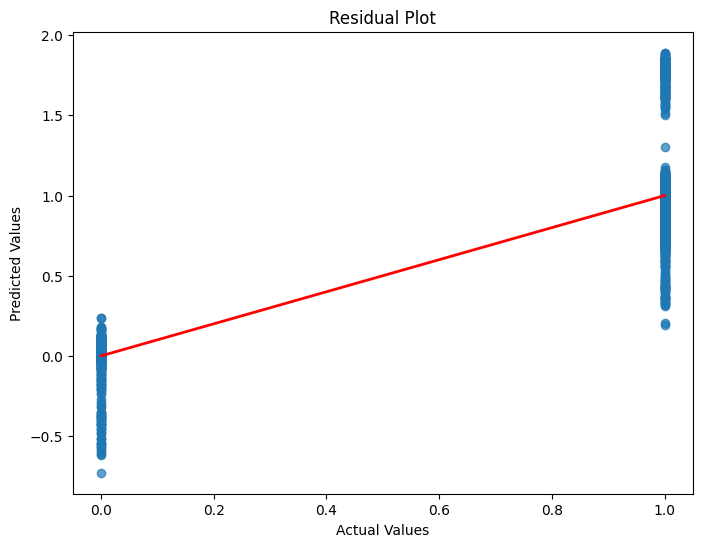

In [40]:
# 3. Residual Plot
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred, alpha=0.7)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linewidth=2)
plt.title('Residual Plot')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.show()

# KNN

In [41]:
import pandas as pd
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler

# Load the dataset
dataset_path = r'D:\CIC-APT-IIOT-2024_CIC-DarkNet-2020_Analysis\CIC-APT-IIoT-2024_dataset.csv'
df = pd.read_csv(dataset_path)

# Fill NaN values if present in categorical columns
df.fillna('unknown', inplace=True)

# Encode categorical columns (Source IP, Destination IP, Protocol_name)
categorical_columns = ['Source IP', 'Destination IP', 'Protocol_name']
le = LabelEncoder()

for col in categorical_columns:
    df[col] = le.fit_transform(df[col])

# Define feature columns and target column
# Exclude non-numeric and irrelevant columns (like IPs or sequence numbers if not relevant)
features = ['flow_duration', 'Header_Length', 'Source Port', 'Destination Port', 'Protocol Type', 'Duration', 
            'Rate', 'Srate', 'Drate', 'fin_flag_number', 'syn_flag_number', 'rst_flag_number', 'psh_flag_number', 
            'ack_flag_number', 'urg_flag_number', 'ece_flag_number', 'cwr_flag_number', 'ack_count', 'syn_count', 
            'fin_count', 'urg_count', 'rst_count', 'max_duration', 'min_duration', 'sum_duration', 'average_duration', 
            'std_duration', 'CoAP', 'HTTP', 'HTTPS', 'DNS', 'Telnet', 'SMTP', 'SSH', 'IRC', 'TCP', 'UDP', 'DHCP', 
            'ARP', 'ICMP', 'IGMP', 'IPv', 'LLC', 'Tot sum', 'Min', 'Max', 'AVG', 'Std', 'Tot size', 'IAT', 'Number', 
            'MAC', 'Magnitue', 'Radius', 'Covariance', 'Variance', 'Weight', 'DS status', 'Fragments', 'Sequence number', 
            'Protocol Version', 'flow_idle_time', 'flow_active_time']  # Add all other numeric features

# Target column
target = 'is_mal'

# Split the data into training and testing sets
X = df[features]
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features (KNN requires feature scaling for better performance)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Initialize the KNN model with k=5 (you can adjust k as needed)
knn_model = KNeighborsClassifier(n_neighbors=5)

# Train the model
knn_model.fit(X_train, y_train)

# Predict on the test data
y_pred = knn_model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print(f"Accuracy: {accuracy:.4f}")
print("Classification Report:")
print(report)


C:\Users\sathw\AppData\Local\Temp\ipykernel_16200\4177471340.py:10: DtypeWarning: Columns (68,69) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(dataset_path)


Accuracy: 0.9997
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     10073
           1       1.00      1.00      1.00     19927

    accuracy                           1.00     30000
   macro avg       1.00      1.00      1.00     30000
weighted avg       1.00      1.00      1.00     30000



In [43]:
import pandas as pd
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.preprocessing import LabelEncoder, StandardScaler
from lime.lime_tabular import LimeTabularExplainer
import joblib
import os
import matplotlib.pyplot as plt

# Load the dataset
dataset_path = r'D:\CIC-APT-IIOT-2024_CIC-DarkNet-2020_Analysis\CIC-APT-IIoT-2024_dataset.csv'
df = pd.read_csv(dataset_path)

# Fill NaN values if present in categorical columns
df.fillna('unknown', inplace=True)

# Encode categorical columns (Source IP, Destination IP, Protocol_name)
categorical_columns = ['Source IP', 'Destination IP', 'Protocol_name']
le = LabelEncoder()

for col in categorical_columns:
    df[col] = le.fit_transform(df[col])

# Define feature columns and target column
features = ['flow_duration', 'Header_Length', 'Source Port', 'Destination Port', 'Protocol Type', 'Duration', 
            'Rate', 'Srate', 'Drate', 'fin_flag_number', 'syn_flag_number', 'rst_flag_number', 'psh_flag_number', 
            'ack_flag_number', 'urg_flag_number', 'ece_flag_number', 'cwr_flag_number', 'ack_count', 'syn_count', 
            'fin_count', 'urg_count', 'rst_count', 'max_duration', 'min_duration', 'sum_duration', 'average_duration', 
            'std_duration', 'CoAP', 'HTTP', 'HTTPS', 'DNS', 'Telnet', 'SMTP', 'SSH', 'IRC', 'TCP', 'UDP', 'DHCP', 
            'ARP', 'ICMP', 'IGMP', 'IPv', 'LLC', 'Tot sum', 'Min', 'Max', 'AVG', 'Std', 'Tot size', 'IAT', 'Number', 
            'MAC', 'Magnitue', 'Radius', 'Covariance', 'Variance', 'Weight', 'DS status', 'Fragments', 'Sequence number', 
            'Protocol Version', 'flow_idle_time', 'flow_active_time']

# Target column
target = 'is_mal'

# Split the data into training and testing sets
X = df[features]
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features (KNN requires feature scaling for better performance)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Initialize the KNN model with k=5
knn_model = KNeighborsClassifier(n_neighbors=5)

# Train the model
knn_model.fit(X_train, y_train)

# Predict on the test data
y_pred = knn_model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

# Save the model size
model_file = "knn_model.joblib"
joblib.dump(knn_model, model_file)
model_size = os.path.getsize(model_file) / 1024  # Size in KB

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=knn_model.classes_)

# Apply LIME
lime_explainer = LimeTabularExplainer(
    X_train,
    feature_names=features,
    class_names=['Not Malicious', 'Malicious'],
    discretize_continuous=True,
)

# Display LIME explanation for the first test instance
lime_exp = lime_explainer.explain_instance(
    X_test[0], knn_model.predict_proba, num_features=10
)
lime_exp.show_in_notebook()

# Print the results
accuracy, report, model_size

C:\Users\sathw\AppData\Local\Temp\ipykernel_16200\1263560135.py:13: DtypeWarning: Columns (68,69) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(dataset_path)


(0.9997333333333334,
 '              precision    recall  f1-score   support\n\n           0       1.00      1.00      1.00     10073\n           1       1.00      1.00      1.00     19927\n\n    accuracy                           1.00     30000\n   macro avg       1.00      1.00      1.00     30000\nweighted avg       1.00      1.00      1.00     30000\n',
 60000.802734375)

<Figure size 800x600 with 0 Axes>

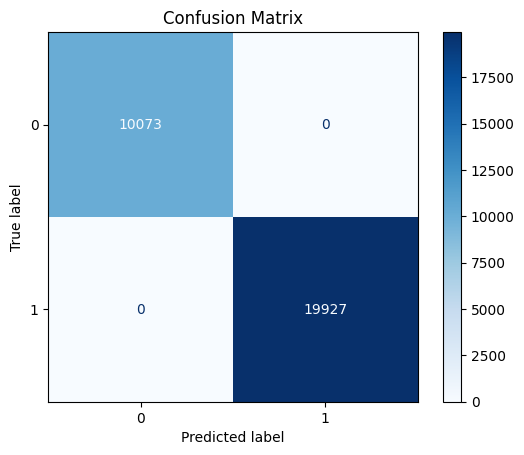

In [46]:
# Display confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=logistic_model.classes_)
plt.figure(figsize=(8, 6))
disp.plot(cmap=plt.cm.Blues, values_format='d')
plt.title("Confusion Matrix")
plt.show()

# RNN+LSTM

In [47]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import classification_report, accuracy_score
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, SimpleRNN
from tensorflow.keras.optimizers import Adam

# Load the dataset
dataset_path = r'D:\CIC-APT-IIOT-2024_CIC-DarkNet-2020_Analysis\CIC-APT-IIoT-2024_dataset.csv'
df = pd.read_csv(dataset_path)

# Fill NaN values if present in categorical columns
df.fillna('unknown', inplace=True)

# Encode categorical columns (Source IP, Destination IP, Protocol_name)
categorical_columns = ['Source IP', 'Destination IP', 'Protocol_name']
le = LabelEncoder()

for col in categorical_columns:
    df[col] = le.fit_transform(df[col])

# Define feature columns and target column
# Exclude non-numeric and irrelevant columns (like IPs or sequence numbers if not relevant)
features = ['flow_duration', 'Header_Length', 'Source Port', 'Destination Port', 'Protocol Type', 'Duration', 
            'Rate', 'Srate', 'Drate', 'fin_flag_number', 'syn_flag_number', 'rst_flag_number', 'psh_flag_number', 
            'ack_flag_number', 'urg_flag_number', 'ece_flag_number', 'cwr_flag_number', 'ack_count', 'syn_count', 
            'fin_count', 'urg_count', 'rst_count', 'max_duration', 'min_duration', 'sum_duration', 'average_duration', 
            'std_duration', 'CoAP', 'HTTP', 'HTTPS', 'DNS', 'Telnet', 'SMTP', 'SSH', 'IRC', 'TCP', 'UDP', 'DHCP', 
            'ARP', 'ICMP', 'IGMP', 'IPv', 'LLC', 'Tot sum', 'Min', 'Max', 'AVG', 'Std', 'Tot size', 'IAT', 'Number', 
            'MAC', 'Magnitue', 'Radius', 'Covariance', 'Variance', 'Weight', 'DS status', 'Fragments', 'Sequence number', 
            'Protocol Version', 'flow_idle_time', 'flow_active_time']  # Add all other numeric features

# Target column
target = 'is_mal'

# Split the data into training and testing sets
X = df[features]
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Reshape the data for RNN/LSTM input (samples, timesteps, features)
X_train = np.expand_dims(X_train, axis=2)  # Adding a timestep dimension
X_test = np.expand_dims(X_test, axis=2)

# Define the RNN+LSTM model
model = Sequential()

# Option 1: Using Simple RNN layer followed by LSTM layer
model.add(SimpleRNN(50, input_shape=(X_train.shape[1], X_train.shape[2]), return_sequences=True))
model.add(LSTM(50, return_sequences=False))

# Add a dense layer with ReLU activation
model.add(Dense(50, activation='relu'))

# Output layer for binary classification
model.add(Dense(1, activation='sigmoid'))  # Sigmoid for binary classification

# Compile the model
model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
model.fit(X_train, y_train, epochs=10, batch_size=64, validation_split=0.2)

# Predict on the test data
y_pred = model.predict(X_test)
y_pred = (y_pred > 0.5).astype(int)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print(f"Accuracy: {accuracy:.4f}")
print("Classification Report:")
print(report)


C:\Users\sathw\AppData\Local\Temp\ipykernel_16200\3435984463.py:13: DtypeWarning: Columns (68,69) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(dataset_path)


Epoch 1/10


c:\Users\sathw\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1500/1500 ━━━━━━━━━━━━━━━━━━━━ 32s 20ms/step - accuracy: 0.9750 - loss: 0.0681 - val_accuracy: 0.9999 - val_loss: 0.0017
Epoch 2/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 30s 20ms/step - accuracy: 0.9997 - loss: 0.0016 - val_accuracy: 1.0000 - val_loss: 7.7469e-05
Epoch 3/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 29s 19ms/step - accuracy: 1.0000 - loss: 1.8809e-05 - val_accuracy: 1.0000 - val_loss: 1.5691e-04
Epoch 4/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 28s 19ms/step - accuracy: 1.0000 - loss: 4.0586e-06 - val_accuracy: 1.0000 - val_loss: 2.0357e-04
Epoch 5/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 28s 19ms/step - accuracy: 1.0000 - loss: 1.5692e-06 - val_accuracy: 1.0000 - val_loss: 2.1365e-04
Epoch 6/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 28s 19ms/step - accuracy: 1.0000 - loss: 6.7770e-07 - val_accuracy: 1.0000 - val_loss: 2.5048e-04
Epoch 7/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 28s 19ms/step - accuracy: 1.0000 - loss: 2.9009e-07 - val_accuracy: 0.9999 - val_loss: 4.6904e-04
Epoch 8/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 2

In [2]:
# Re-importing libraries and resetting the required variables due to state reset.
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, ConfusionMatrixDisplay
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, SimpleRNN
from tensorflow.keras.optimizers import Adam
import lime.lime_tabular
import os
import matplotlib.pyplot as plt

# Load the dataset
dataset_path = r'D:\CIC-APT-IIOT-2024_CIC-DarkNet-2020_Analysis\CIC-APT-IIoT-2024_dataset.csv'
df = pd.read_csv(dataset_path)

# Fill NaN values if present in categorical columns
df.fillna('unknown', inplace=True)

# Encode categorical columns (Source IP, Destination IP, Protocol_name)
categorical_columns = ['Source IP', 'Destination IP', 'Protocol_name']
le = LabelEncoder()

for col in categorical_columns:
    df[col] = le.fit_transform(df[col])

# Define feature columns and target column
features = ['flow_duration', 'Header_Length', 'Source Port', 'Destination Port', 'Protocol Type', 'Duration', 
            'Rate', 'Srate', 'Drate', 'fin_flag_number', 'syn_flag_number', 'rst_flag_number', 'psh_flag_number', 
            'ack_flag_number', 'urg_flag_number', 'ece_flag_number', 'cwr_flag_number', 'ack_count', 'syn_count', 
            'fin_count', 'urg_count', 'rst_count', 'max_duration', 'min_duration', 'sum_duration', 'average_duration', 
            'std_duration', 'CoAP', 'HTTP', 'HTTPS', 'DNS', 'Telnet', 'SMTP', 'SSH', 'IRC', 'TCP', 'UDP', 'DHCP', 
            'ARP', 'ICMP', 'IGMP', 'IPv', 'LLC', 'Tot sum', 'Min', 'Max', 'AVG', 'Std', 'Tot size', 'IAT', 'Number', 
            'MAC', 'Magnitue', 'Radius', 'Covariance', 'Variance', 'Weight', 'DS status', 'Fragments', 
            'Sequence number', 'Protocol Version', 'flow_idle_time', 'flow_active_time']

target = 'is_mal'

# Split the data into training and testing sets
X = df[features]
y = df[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Reshape the data for RNN/LSTM input
X_train = np.expand_dims(X_train, axis=2)  # Adding a timestep dimension
X_test = np.expand_dims(X_test, axis=2)

# Define the RNN+LSTM model
model = Sequential([
    SimpleRNN(50, input_shape=(X_train.shape[1], X_train.shape[2]), return_sequences=True),
    LSTM(50, return_sequences=False),
    Dense(50, activation='relu'),
    Dense(1, activation='sigmoid')  # Sigmoid for binary classification
])

# Compile and train the model
model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=['accuracy'])
model.fit(X_train, y_train, epochs=10, batch_size=64, validation_split=0.2)

# Predict on the test data
y_pred = (model.predict(X_test) > 0.5).astype(int)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

# 1. Calculate model size and number of parameters
model.save("rnn_lstm_model.h5")
model_size = os.path.getsize("rnn_lstm_model.h5") / 1024  # Size in KB
n_parameters = model.count_params()

# Print model size and number of parameters
print(f"Model Size: {model_size:.2f} KB")
print(f"Number of Parameters: {n_parameters}")

# Outputs for model size and parameters
model_size, n_parameters

C:\Users\sathw\AppData\Local\Temp\ipykernel_27540\2064953189.py:16: DtypeWarning: Columns (68,69) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(dataset_path)


Epoch 1/10


c:\Users\sathw\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1500/1500 ━━━━━━━━━━━━━━━━━━━━ 31s 20ms/step - accuracy: 0.9801 - loss: 0.0644 - val_accuracy: 0.9998 - val_loss: 0.0010
Epoch 2/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 29s 19ms/step - accuracy: 0.9948 - loss: 0.0158 - val_accuracy: 1.0000 - val_loss: 1.8178e-04
Epoch 3/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 29s 19ms/step - accuracy: 0.9999 - loss: 3.6459e-04 - val_accuracy: 1.0000 - val_loss: 2.8348e-05
Epoch 4/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 28s 19ms/step - accuracy: 0.9995 - loss: 0.0020 - val_accuracy: 0.9996 - val_loss: 0.0017
Epoch 5/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 29s 19ms/step - accuracy: 0.9996 - loss: 0.0014 - val_accuracy: 1.0000 - val_loss: 8.1620e-05
Epoch 6/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 28s 19ms/step - accuracy: 0.9998 - loss: 7.0883e-04 - val_accuracy: 0.9981 - val_loss: 0.0059
Epoch 7/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 29s 19ms/step - accuracy: 0.9979 - loss: 0.0065 - val_accuracy: 1.0000 - val_loss: 1.1911e-05
Epoch 8/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 31s 21ms/step - accur

Model Size: 339.00 KB
Number of Parameters: 25401


ValueError: Exception encountered when calling Sequential.call().

[1mCannot take the length of shape with unknown rank.[0m

Arguments received by Sequential.call():
  • inputs=tf.Tensor(shape=<unknown>, dtype=float32)
  • training=False
  • mask=None

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step


<Figure size 800x600 with 0 Axes>

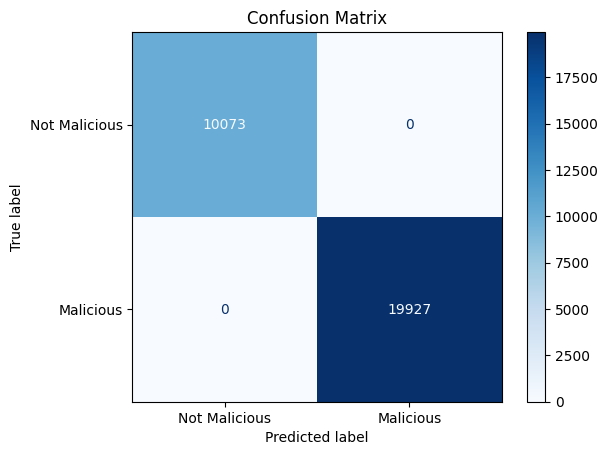

In [4]:
import numpy as np
from lime.lime_tabular import LimeTabularExplainer
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Define a predict_proba function for LIME
def predict_proba_fn(data):
    """
    LIME requires probabilities for both classes in a 2D array.
    This function ensures the model output matches that format.
    """
    probs = model.predict(data.reshape(data.shape[0], X_train.shape[1], X_train.shape[2]))
    return np.hstack([1 - probs, probs])  # Probabilities for both classes

# Apply LIME for explanations
lime_explainer = LimeTabularExplainer(
    X_train.reshape(X_train.shape[0], -1),  # Flatten for LIME compatibility
    feature_names=features,
    class_names=['Not Malicious', 'Malicious'],
    discretize_continuous=True,
)

# Explain the first test instance
lime_exp = lime_explainer.explain_instance(
    X_test[0].reshape(-1),  # Flatten the test instance
    predict_proba_fn,  # Wrapped predict function
    num_features=10,
)
lime_exp.show_in_notebook()

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=['Not Malicious', 'Malicious'])

# Plot confusion matrix
plt.figure(figsize=(8, 6))
disp.plot(cmap=plt.cm.Blues, values_format='d')
plt.title("Confusion Matrix")
plt.show()

# MLP

In [5]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import classification_report, accuracy_score
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout

# Load the dataset
dataset_path = r'D:\CIC-APT-IIOT-2024_CIC-DarkNet-2020_Analysis\CIC-APT-IIoT-2024_dataset.csv'
df = pd.read_csv(dataset_path)

# Fill NaN values if present in categorical columns
df.fillna('unknown', inplace=True)

# Encode categorical columns (Source IP, Destination IP, Protocol_name)
categorical_columns = ['Source IP', 'Destination IP', 'Protocol_name']
le = LabelEncoder()

for col in categorical_columns:
    df[col] = le.fit_transform(df[col])

# Define feature columns and target column
features = ['flow_duration', 'Header_Length', 'Source Port', 'Destination Port', 'Protocol Type', 'Duration', 
            'Rate', 'Srate', 'Drate', 'fin_flag_number', 'syn_flag_number', 'rst_flag_number', 'psh_flag_number', 
            'ack_flag_number', 'urg_flag_number', 'ece_flag_number', 'cwr_flag_number', 'ack_count', 'syn_count', 
            'fin_count', 'urg_count', 'rst_count', 'max_duration', 'min_duration', 'sum_duration', 'average_duration', 
            'std_duration', 'CoAP', 'HTTP', 'HTTPS', 'DNS', 'Telnet', 'SMTP', 'SSH', 'IRC', 'TCP', 'UDP', 'DHCP', 
            'ARP', 'ICMP', 'IGMP', 'IPv', 'LLC', 'Tot sum', 'Min', 'Max', 'AVG', 'Std', 'Tot size', 'IAT', 'Number', 
            'MAC', 'Magnitue', 'Radius', 'Covariance', 'Variance', 'Weight', 'DS status', 'Fragments', 'Sequence number', 
            'Protocol Version', 'flow_idle_time', 'flow_active_time']  # Add all other numeric features

# Target column
target = 'is_mal'

# Split the data into training and testing sets
X = df[features]
y = df[target]

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Initialize the MLP model
model = Sequential()

# Input layer + First hidden layer
model.add(Dense(128, activation='relu', input_shape=(X_train.shape[1],)))

# Add Dropout to avoid overfitting
model.add(Dropout(0.3))

# Second hidden layer
model.add(Dense(64, activation='relu'))

# Add Dropout to avoid overfitting
model.add(Dropout(0.3))

# Output layer for binary classification
model.add(Dense(1, activation='sigmoid'))

# Compile the model for binary classification
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
model.fit(X_train, y_train, epochs=10, batch_size=64, validation_split=0.2)

# Predict on the test set
y_pred = model.predict(X_test)
y_pred_classes = (y_pred > 0.5).astype("int32")

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred_classes)
report = classification_report(y_test, y_pred_classes)

print(f"Accuracy: {accuracy:.4f}")
print("Classification Report:")
print(report)


C:\Users\sathw\AppData\Local\Temp\ipykernel_27540\2604714077.py:11: DtypeWarning: Columns (68,69) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(dataset_path)


Epoch 1/10


c:\Users\sathw\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


1500/1500 ━━━━━━━━━━━━━━━━━━━━ 3s 1ms/step - accuracy: 0.9777 - loss: 0.0691 - val_accuracy: 0.9997 - val_loss: 0.0024
Epoch 2/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.9998 - loss: 7.7924e-04 - val_accuracy: 0.9998 - val_loss: 0.0012
Epoch 3/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.9997 - loss: 0.0015 - val_accuracy: 0.9998 - val_loss: 2.8265e-04
Epoch 4/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.9998 - loss: 9.3636e-04 - val_accuracy: 1.0000 - val_loss: 3.0517e-06
Epoch 5/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.9998 - loss: 8.0712e-04 - val_accuracy: 1.0000 - val_loss: 4.4336e-04
Epoch 6/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 1.0000 - loss: 1.6806e-04 - val_accuracy: 1.0000 - val_loss: 1.4263e-05
Epoch 7/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 1.0000 - loss: 2.4080e-04 - val_accuracy: 0.9998 - val_loss: 3.7771e-04
Epoch 8/10
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accur

In [8]:
import lime.lime_tabular

# Initialize the LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    X_train, 
    feature_names=features, 
    class_names=['Not Malicious', 'Malicious'], 
    discretize_continuous=True
)

# Define a prediction function for LIME that outputs probabilities for both classes
def predict_proba_for_lime(data):
    proba = model.predict(data)
    return np.hstack([1 - proba, proba])  # Append probabilities for class 0 and class 1

# Explain the first instance in the test set
i = 0  # Index of the instance
exp = explainer.explain_instance(
    X_test[i], 
    predict_proba_for_lime,  # Use the modified prediction function
    num_features=10
)

# Display the explanation
exp.show_in_notebook()

157/157 ━━━━━━━━━━━━━━━━━━━━ 0s 723us/step


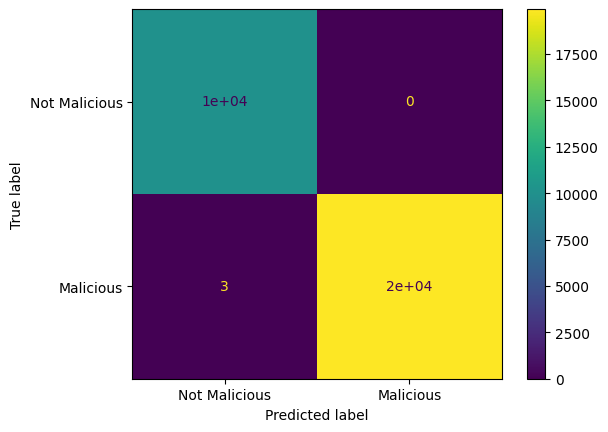

In [9]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Compute confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred_classes)

# Display confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=['Not Malicious', 'Malicious'])
disp.plot()

# Transformers

In [10]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, MultiHeadAttention, LayerNormalization, Dropout, GlobalAveragePooling1D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from sklearn.metrics import classification_report

# Load the dataset
dataset_path = r'D:\CIC-APT-IIOT-2024_CIC-DarkNet-2020_Analysis\CIC-APT-IIoT-2024_dataset.csv'
df = pd.read_csv(dataset_path)

# Fill NaN values if present in categorical columns
df.fillna('unknown', inplace=True)

# Encode categorical columns (Source IP, Destination IP, Protocol_name)
categorical_columns = ['Source IP', 'Destination IP', 'Protocol_name']
le = LabelEncoder()

for col in categorical_columns:
    df[col] = le.fit_transform(df[col])

# Define feature columns and target column
features = ['flow_duration', 'Header_Length', 'Source Port', 'Destination Port', 'Protocol Type', 'Duration', 
            'Rate', 'Srate', 'Drate', 'fin_flag_number', 'syn_flag_number', 'rst_flag_number', 'psh_flag_number', 
            'ack_flag_number', 'urg_flag_number', 'ece_flag_number', 'cwr_flag_number', 'ack_count', 'syn_count', 
            'fin_count', 'urg_count', 'rst_count', 'max_duration', 'min_duration', 'sum_duration', 'average_duration', 
            'std_duration', 'CoAP', 'HTTP', 'HTTPS', 'DNS', 'Telnet', 'SMTP', 'SSH', 'IRC', 'TCP', 'UDP', 'DHCP', 
            'ARP', 'ICMP', 'IGMP', 'IPv', 'LLC', 'Tot sum', 'Min', 'Max', 'AVG', 'Std', 'Tot size', 'IAT', 'Number', 
            'MAC', 'Magnitue', 'Radius', 'Covariance', 'Variance', 'Weight', 'DS status', 'Fragments', 'Sequence number', 
            'Protocol Version', 'flow_idle_time', 'flow_active_time']  # Add all other numeric features

# Target column
target = 'is_mal'

# Split the data into training and testing sets
X = df[features]
y = df[target]

# Encode the target labels
le_target = LabelEncoder()
y = le_target.fit_transform(y)

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Reshape input for transformer (batch_size, seq_length, feature_dim)
X_reshaped = X_scaled.reshape((X_scaled.shape[0], X_scaled.shape[1], 1))

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_reshaped, y, test_size=0.2, random_state=42)

# One-hot encode the target
y_train_cat = to_categorical(y_train)
y_test_cat = to_categorical(y_test)

# Transformer block
def transformer_encoder(inputs, head_size, num_heads, ff_dim, dropout=0):
    x = MultiHeadAttention(key_dim=head_size, num_heads=num_heads, dropout=dropout)(inputs, inputs)
    x = Dropout(dropout)(x)
    x = LayerNormalization(epsilon=1e-6)(x)
    res = x + inputs

    x = Dense(ff_dim, activation="relu")(res)
    x = Dropout(dropout)(x)
    x = Dense(inputs.shape[-1])(x)
    x = LayerNormalization(epsilon=1e-6)(x)
    return x + res

# Build the transformer model
def build_model(input_shape, head_size, num_heads, ff_dim, num_transformer_blocks, mlp_units, dropout=0, mlp_dropout=0, num_classes=2):
    inputs = Input(shape=input_shape)
    x = inputs
    for _ in range(num_transformer_blocks):
        x = transformer_encoder(x, head_size, num_heads, ff_dim, dropout)

    x = GlobalAveragePooling1D()(x)  # Add this line to reduce sequence dimension
    x = Dense(mlp_units, activation="relu")(x)
    x = Dropout(mlp_dropout)(x)
    outputs = Dense(num_classes, activation="softmax")(x)

    return Model(inputs, outputs)

# Model parameters
input_shape = X_train.shape[1:]
head_size = 256
num_heads = 4
ff_dim = 4
num_transformer_blocks = 4
mlp_units = 128
dropout = 0.1
mlp_dropout = 0.1
num_classes = y_train_cat.shape[1]

# Create and compile the model
model = build_model(
    input_shape,
    head_size,
    num_heads,
    ff_dim,
    num_transformer_blocks,
    mlp_units,
    dropout,
    mlp_dropout,
    num_classes
)

model.compile(optimizer=Adam(learning_rate=1e-4), loss="categorical_crossentropy", metrics=["accuracy"])

# Train the model
history = model.fit(
    X_train,
    y_train_cat,
    batch_size=32,
    epochs=5,
    validation_split=0.2,
    verbose=1
)

# Evaluate the model
loss, accuracy = model.evaluate(X_test, y_test_cat, verbose=0)
print(f'Test accuracy: {accuracy:.4f}')

# Make predictions
y_pred = model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)

# Convert back to original labels
y_pred_original = le_target.inverse_transform(y_pred_classes)
y_test_original = le_target.inverse_transform(y_test)

# Print classification report
print(classification_report(y_test_original, y_pred_original))


C:\Users\sathw\AppData\Local\Temp\ipykernel_27540\3069030513.py:13: DtypeWarning: Columns (68,69) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(dataset_path)


Epoch 1/5
3000/3000 ━━━━━━━━━━━━━━━━━━━━ 354s 115ms/step - accuracy: 0.6936 - loss: 0.5868 - val_accuracy: 0.7793 - val_loss: 0.4869
Epoch 2/5
3000/3000 ━━━━━━━━━━━━━━━━━━━━ 365s 122ms/step - accuracy: 0.7713 - loss: 0.4891 - val_accuracy: 0.7648 - val_loss: 0.4803
Epoch 3/5
3000/3000 ━━━━━━━━━━━━━━━━━━━━ 355s 118ms/step - accuracy: 0.7651 - loss: 0.4892 - val_accuracy: 0.7673 - val_loss: 0.4777
Epoch 4/5
3000/3000 ━━━━━━━━━━━━━━━━━━━━ 343s 114ms/step - accuracy: 0.7658 - loss: 0.4844 - val_accuracy: 0.7699 - val_loss: 0.4768
Epoch 5/5
3000/3000 ━━━━━━━━━━━━━━━━━━━━ 347s 116ms/step - accuracy: 0.7683 - loss: 0.4812 - val_accuracy: 0.7700 - val_loss: 0.4765
Test accuracy: 0.7644
938/938 ━━━━━━━━━━━━━━━━━━━━ 46s 49ms/step
              precision    recall  f1-score   support

           0       0.68      0.57      0.62     10073
           1       0.80      0.86      0.83     19927

    accuracy                           0.76     30000
   macro avg       0.74      0.72      0.72     3000

# Auto Encoders

In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import classification_report, accuracy_score

# Load the dataset
dataset_path = r'D:\CIC-APT-IIOT-2024_CIC-DarkNet-2020_Analysis\CIC-APT-IIoT-2024_dataset.csv'
df = pd.read_csv(dataset_path)

# Fill NaN values if present in categorical columns
df.fillna('unknown', inplace=True)

# Encode categorical columns (Source IP, Destination IP, Protocol_name)
categorical_columns = ['Source IP', 'Destination IP', 'Protocol_name']
le = LabelEncoder()

for col in categorical_columns:
    df[col] = le.fit_transform(df[col])

# Define feature columns and target column
# Exclude non-numeric and irrelevant columns (like IPs or sequence numbers if not relevant)
features = ['flow_duration', 'Header_Length', 'Source Port', 'Destination Port', 'Protocol Type', 'Duration', 
            'Rate', 'Srate', 'Drate', 'fin_flag_number', 'syn_flag_number', 'rst_flag_number', 'psh_flag_number', 
            'ack_flag_number', 'urg_flag_number', 'ece_flag_number', 'cwr_flag_number', 'ack_count', 'syn_count', 
            'fin_count', 'urg_count', 'rst_count', 'max_duration', 'min_duration', 'sum_duration', 'average_duration', 
            'std_duration', 'CoAP', 'HTTP', 'HTTPS', 'DNS', 'Telnet', 'SMTP', 'SSH', 'IRC', 'TCP', 'UDP', 'DHCP', 
            'ARP', 'ICMP', 'IGMP', 'IPv', 'LLC', 'Tot sum', 'Min', 'Max', 'AVG', 'Std', 'Tot size', 'IAT', 'Number', 
            'MAC', 'Magnitue', 'Radius', 'Covariance', 'Variance', 'Weight', 'DS status', 'Fragments', 'Sequence number', 
            'Protocol Version', 'flow_idle_time', 'flow_active_time']  # Add all other numeric features

# Target column
target = 'is_mal'

# Split the data into features and target
X = df[features]
y = df[target]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Define the Autoencoder architecture
input_dim = X_train_scaled.shape[1]
encoding_dim = 32  # Number of neurons in the bottleneck layer

# Input layer
input_layer = Input(shape=(input_dim,))

# Encoder
encoder = Dense(64, activation="relu")(input_layer)
encoder = Dense(encoding_dim, activation="relu")(encoder)

# Decoder
decoder = Dense(64, activation="relu")(encoder)
decoder = Dense(input_dim, activation="linear")(decoder)

# Autoencoder model
autoencoder = Model(inputs=input_layer, outputs=decoder)

# Compile the model
autoencoder.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Train the model
history = autoencoder.fit(
    X_train_scaled, X_train_scaled,  # Training the model to reconstruct the input
    epochs=50,
    batch_size=256,
    shuffle=True,
    validation_split=0.2,
    verbose=1
)

# Function to compute reconstruction error (MSE)
def get_reconstruction_error(model, data):
    reconstructions = model.predict(data)
    mse = np.mean(np.power(data - reconstructions, 2), axis=1)
    return mse

# Get reconstruction errors for training and testing sets
train_errors = get_reconstruction_error(autoencoder, X_train_scaled)
test_errors = get_reconstruction_error(autoencoder, X_test_scaled)

# Determine the threshold for anomaly detection
threshold = np.percentile(train_errors, 95)  # You can adjust this threshold based on the use case

# Predict anomalies based on reconstruction error
y_pred_train = (train_errors > threshold).astype(int)  # 1 for anomalies, 0 for normal
y_pred_test = (test_errors > threshold).astype(int)

# Evaluate the model on the training set
train_accuracy = accuracy_score(y_train, y_pred_train)
train_report = classification_report(y_train, y_pred_train)

# Evaluate the model on the test set
test_accuracy = accuracy_score(y_test, y_pred_test)
test_report = classification_report(y_test, y_pred_test)

# Print the results
print(f"Train Accuracy: {train_accuracy:.4f}")
print("Train Classification Report:")
print(train_report)

print(f"Test Accuracy: {test_accuracy:.4f}")
print("Test Classification Report:")
print(test_report)


C:\Users\sathw\AppData\Local\Temp\ipykernel_28448\2923481161.py:12: DtypeWarning: Columns (68,69) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(dataset_path)


Epoch 1/50
375/375 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4209 - val_loss: 0.0543
Epoch 2/50
375/375 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0441 - val_loss: 0.0222
Epoch 3/50
375/375 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0203 - val_loss: 0.0131
Epoch 4/50
375/375 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0167 - val_loss: 0.0117
Epoch 5/50
375/375 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0100 - val_loss: 0.0089
Epoch 6/50
375/375 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0067 - val_loss: 0.0053
Epoch 7/50
375/375 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0068 - val_loss: 0.0050
Epoch 8/50
375/375 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0083 - val_loss: 0.0043
Epoch 9/50
375/375 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0056 - val_loss: 0.0041
Epoch 10/50
375/375 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0051 - val_loss: 0.0039
Epoch 11/50
375/375 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0042 - val_loss: 0.0033
Epoch 12/50
375/375 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step

In [3]:
# Summarize the model
autoencoder.summary()

# Calculate the number of parameters
trainable_params = autoencoder.count_params()
print(f"Total number of parameters: {trainable_params}")

# Estimate model size in bytes
model_size_bytes = trainable_params * 4  # 4 bytes per parameter for float32

# Convert to kilobytes (KB) and megabytes (MB)
model_size_kb = model_size_bytes / 1024
model_size_mb = model_size_kb / 1024

print(f"Estimated model size: {model_size_kb:.2f} KB ({model_size_mb:.2f} MB)")

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 63)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │         4,096 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 64)             │         2,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 63)             │         4,095 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 37,151 (145.12 KB)

 Trainable params: 12,383 (48.37 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 24,768 (96.75 KB)

Total number of parameters: 12383
Estimated model size: 48.37 KB (0.05 MB)


# 1-D CNN

In [4]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, GlobalMaxPooling1D, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from sklearn.metrics import classification_report

# Load the dataset
dataset_path = r'D:\CIC-APT-IIOT-2024_CIC-DarkNet-2020_Analysis\CIC-APT-IIoT-2024_dataset.csv'
df = pd.read_csv(dataset_path)

# Fill NaN values if present in categorical columns
df.fillna('unknown', inplace=True)

# Encode categorical columns (Source IP, Destination IP, Protocol_name)
categorical_columns = ['Source IP', 'Destination IP', 'Protocol_name']
le_avclass = LabelEncoder()

for col in categorical_columns:
    df[col] = le_avclass.fit_transform(df[col])

# Define feature columns and target column
# Exclude non-numeric and irrelevant columns (like IPs or sequence numbers if not relevant)
features = ['flow_duration', 'Header_Length', 'Source Port', 'Destination Port', 'Protocol Type', 'Duration', 
            'Rate', 'Srate', 'Drate', 'fin_flag_number', 'syn_flag_number', 'rst_flag_number', 'psh_flag_number', 
            'ack_flag_number', 'urg_flag_number', 'ece_flag_number', 'cwr_flag_number', 'ack_count', 'syn_count', 
            'fin_count', 'urg_count', 'rst_count', 'max_duration', 'min_duration', 'sum_duration', 'average_duration', 
            'std_duration', 'CoAP', 'HTTP', 'HTTPS', 'DNS', 'Telnet', 'SMTP', 'SSH', 'IRC', 'TCP', 'UDP', 'DHCP', 
            'ARP', 'ICMP', 'IGMP', 'IPv', 'LLC', 'Tot sum', 'Min', 'Max', 'AVG', 'Std', 'Tot size', 'IAT', 'Number', 
            'MAC', 'Magnitue', 'Radius', 'Covariance', 'Variance', 'Weight', 'DS status', 'Fragments', 'Sequence number', 
            'Protocol Version', 'flow_idle_time', 'flow_active_time']  # Add all other numeric features

# Target column
target = 'is_mal'

# Split the data into features and target
X = df[features]
y = df[target]

# Encode the target labels
le_target = LabelEncoder()
y = le_target.fit_transform(y)

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Reshape the input for CNN (samples, time steps, features)
X_reshaped = X_scaled.reshape((X_scaled.shape[0], X_scaled.shape[1], 1))

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_reshaped, y, test_size=0.2, random_state=42)

# Convert labels to categorical (One-hot encoding)
y_train_cat = to_categorical(y_train)
y_test_cat = to_categorical(y_test)

# Define the CNN model
model = Sequential([
    Conv1D(32, 1, activation='relu', input_shape=(X_train.shape[1], 1)),
    GlobalMaxPooling1D(),
    Dense(64, activation='relu'),
    Dropout(0.5),
    Dense(y_train_cat.shape[1], activation='softmax')  # Softmax for multi-class classification
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(X_train, y_train_cat, epochs=50, batch_size=32, validation_split=0.2, verbose=1)

# Evaluate the model
loss, accuracy = model.evaluate(X_test, y_test_cat, verbose=0)
print(f'Test accuracy: {accuracy:.4f}')

# Make predictions
y_pred = model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)

# Convert back to original labels
y_pred_original = le_target.inverse_transform(y_pred_classes)
y_test_original = le_target.inverse_transform(y_test)

# Print classification report
print(classification_report(y_test_original, y_pred_original))


C:\Users\sathw\AppData\Local\Temp\ipykernel_28448\2296512587.py:13: DtypeWarning: Columns (68,69) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(dataset_path)


Epoch 1/50


c:\Users\sathw\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3000/3000 ━━━━━━━━━━━━━━━━━━━━ 6s 2ms/step - accuracy: 0.7258 - loss: 0.5215 - val_accuracy: 0.8902 - val_loss: 0.2393
Epoch 2/50
3000/3000 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step - accuracy: 0.8832 - loss: 0.2553 - val_accuracy: 0.8890 - val_loss: 0.2289
Epoch 3/50
3000/3000 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - accuracy: 0.8863 - loss: 0.2438 - val_accuracy: 0.8890 - val_loss: 0.2282
Epoch 4/50
3000/3000 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - accuracy: 0.8866 - loss: 0.2412 - val_accuracy: 0.8890 - val_loss: 0.2276
Epoch 5/50
3000/3000 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - accuracy: 0.8850 - loss: 0.2419 - val_accuracy: 0.8895 - val_loss: 0.2257
Epoch 6/50
3000/3000 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - accuracy: 0.8883 - loss: 0.2335 - val_accuracy: 0.8895 - val_loss: 0.2439
Epoch 7/50
3000/3000 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - accuracy: 0.8882 - loss: 0.2351 - val_accuracy: 0.8907 - val_loss: 0.2210
Epoch 8/50
3000/3000 ━━━━━━━━━━━━━━━━━━━━ 4s 1ms/step - accuracy: 0.8892 - loss: 0.2294 - val_accurac

In [7]:
# Summarize the model
model.summary()

# Calculate the total number of trainable parameters
trainable_params = model.count_params()
print(f"Total number of trainable parameters: {trainable_params}")

# Estimate model size
# Assuming each parameter is a float32 (4 bytes)
model_size_bytes = trainable_params * 4  # 4 bytes per parameter for float32
model_size_kb = model_size_bytes / 1024  # Convert bytes to kilobytes
model_size_mb = model_size_kb / 1024     # Convert kilobytes to megabytes

print(f"Estimated model size: {model_size_kb:.2f} KB ({model_size_mb:.2f} MB)")

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                 │ (None, 63, 32)         │            64 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_max_pooling1d            │ (None, 32)             │             0 │
│ (GlobalMaxPooling1D)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 64)             │         2,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 2)              │           130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,920 (27.04 KB)

 Trainable params: 2,306 (9.01 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,614 (18.03 KB)

Total number of trainable parameters: 2306
Estimated model size: 9.01 KB (0.01 MB)


# Hybrid and Essemble Methods

# stacking ensemble

In [10]:
pip install --upgrade scikit-learn xgboost

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [3]:
pip install mlxtend

   ---------------------------------------- 0.0/1.4 MB ? eta -:--:--
   ---------------------------------------- 1.4/1.4 MB 6.3 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


*XGboost, RF and MLP*

C:\Users\sathw\AppData\Local\Temp\ipykernel_14556\3797160392.py:14: DtypeWarning: Columns (68,69) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(dataset_path)
c:\Users\sathw\AppData\Local\Programs\Python\Python310\lib\site-packages\xgboost\core.py:158: UserWarning: [17:07:39] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0c55ff5f71b100e98-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     10073
           1       1.00      1.00      1.00     19927

    accuracy                           1.00     30000
   macro avg       1.00      1.00      1.00     30000
weighted avg       1.00      1.00      1.00     30000



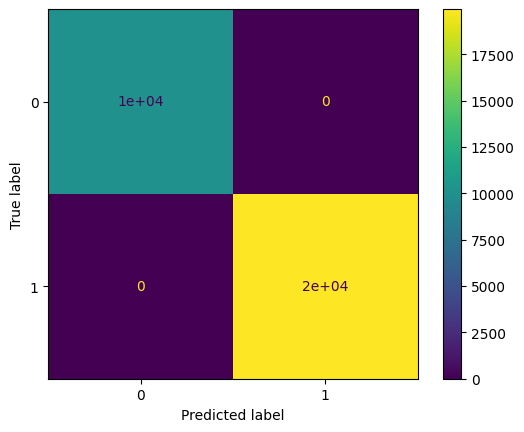

In [4]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression
from mlxtend.classifier import StackingClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import lime.lime_tabular

# Load the dataset
dataset_path = r'D:\CIC-APT-IIOT-2024_CIC-DarkNet-2020_Analysis\CIC-APT-IIoT-2024_dataset.csv'
df = pd.read_csv(dataset_path)

# Fill missing values
df.fillna('unknown', inplace=True)

# Encode categorical columns
categorical_columns = ['Source IP', 'Destination IP', 'Protocol_name']
le_categorical = LabelEncoder()
for col in categorical_columns:
    df[col] = le_categorical.fit_transform(df[col])

# Define features and target
features = ['flow_duration', 'Header_Length', 'Source Port', 'Destination Port', 'Protocol Type', 'Duration', 
            'Rate', 'Srate', 'Drate', 'fin_flag_number', 'syn_flag_number', 'rst_flag_number', 'psh_flag_number', 
            'ack_flag_number', 'urg_flag_number', 'ece_flag_number', 'cwr_flag_number', 'ack_count', 'syn_count', 
            'fin_count', 'urg_count', 'rst_count', 'max_duration', 'min_duration', 'sum_duration', 'average_duration', 
            'std_duration', 'CoAP', 'HTTP', 'HTTPS', 'DNS', 'Telnet', 'SMTP', 'SSH', 'IRC', 'TCP', 'UDP', 'DHCP', 
            'ARP', 'ICMP', 'IGMP', 'IPv', 'LLC', 'Tot sum', 'Min', 'Max', 'AVG', 'Std', 'Tot size', 'IAT', 'Number', 
            'MAC', 'Magnitue', 'Radius', 'Covariance', 'Variance', 'Weight', 'DS status', 'Fragments', 'Sequence number', 
            'Protocol Version', 'flow_idle_time', 'flow_active_time']
target = 'is_mal'

X = df[features]
y = df[target]

# Encode target column
le_target = LabelEncoder()
y = le_target.fit_transform(y)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Define base models
xgb = XGBClassifier(use_label_encoder=False, eval_metric='logloss')
rf = RandomForestClassifier(random_state=42)
lr = LogisticRegression()

# Define stacking model
stack_model = StackingClassifier(
    classifiers=[xgb, rf],
    meta_classifier=lr
)

# Train the stacking model
stack_model.fit(X_train_scaled, y_train)

# Predictions
y_pred = stack_model.predict(X_test_scaled)

# Classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=le_target.classes_)
disp.plot()

# LIME Predictions
explainer = lime.lime_tabular.LimeTabularExplainer(
    X_train_scaled, 
    feature_names=features, 
    class_names=le_target.classes_, 
    discretize_continuous=True
)
i = 0  # Instance index
explanation = explainer.explain_instance(
    X_test_scaled[i], 
    stack_model.predict_proba, 
    num_features=10
)
explanation.show_in_notebook()

*RF, SVM and LR*

C:\Users\sathw\AppData\Local\Temp\ipykernel_14556\1600473619.py:14: DtypeWarning: Columns (68,69) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(dataset_path)


Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     10073
           1       1.00      1.00      1.00     19927

    accuracy                           1.00     30000
   macro avg       1.00      1.00      1.00     30000
weighted avg       1.00      1.00      1.00     30000

Estimated model size: 0.01 KB (0.00 MB)


C:\Users\sathw\AppData\Local\Temp\ipykernel_14556\1600473619.py:80: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  disp.figure_.show()


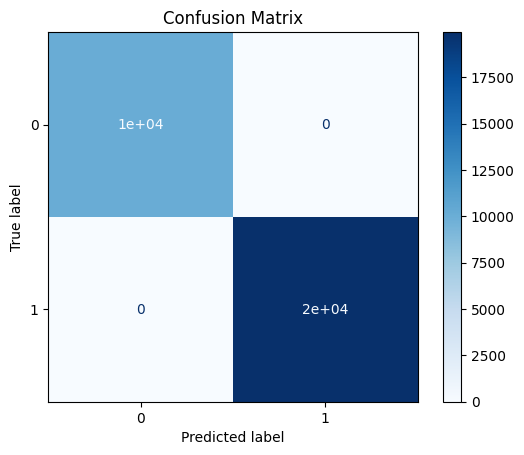

In [5]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import StackingClassifier
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split
from lime.lime_tabular import LimeTabularExplainer

# Load the dataset
dataset_path = r'D:\CIC-APT-IIOT-2024_CIC-DarkNet-2020_Analysis\CIC-APT-IIoT-2024_dataset.csv'
df = pd.read_csv(dataset_path)

# Fill NaN values if present in categorical columns
df.fillna('unknown', inplace=True)

# Encode categorical columns
categorical_columns = ['Source IP', 'Destination IP', 'Protocol_name']
le_avclass = LabelEncoder()

for col in categorical_columns:
    df[col] = le_avclass.fit_transform(df[col])

# Define features and target
features = ['flow_duration', 'Header_Length', 'Source Port', 'Destination Port', 'Protocol Type', 'Duration', 
            'Rate', 'Srate', 'Drate', 'fin_flag_number', 'syn_flag_number', 'rst_flag_number', 'psh_flag_number', 
            'ack_flag_number', 'urg_flag_number', 'ece_flag_number', 'cwr_flag_number', 'ack_count', 'syn_count', 
            'fin_count', 'urg_count', 'rst_count', 'max_duration', 'min_duration', 'sum_duration', 'average_duration', 
            'std_duration', 'CoAP', 'HTTP', 'HTTPS', 'DNS', 'Telnet', 'SMTP', 'SSH', 'IRC', 'TCP', 'UDP', 'DHCP', 
            'ARP', 'ICMP', 'IGMP', 'IPv', 'LLC', 'Tot sum', 'Min', 'Max', 'AVG', 'Std', 'Tot size', 'IAT', 'Number', 
            'MAC', 'Magnitue', 'Radius', 'Covariance', 'Variance', 'Weight', 'DS status', 'Fragments', 'Sequence number', 
            'Protocol Version', 'flow_idle_time', 'flow_active_time']  # Add all other numeric features
target = 'is_mal'

X = df[features]
y = df[target]

# Encode the target labels
le_target = LabelEncoder()
y = le_target.fit_transform(y)

# Split the dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Define base models
estimators = [
    ('rf', RandomForestClassifier(n_estimators=100, random_state=42)),
    ('svm', SVC(probability=True, random_state=42)),
    ('lr', LogisticRegression(max_iter=1000, random_state=42))
]

# Define stacking classifier
stacking_model = StackingClassifier(
    estimators=estimators,
    final_estimator=LogisticRegression(max_iter=1000, random_state=42)
)

# Train the model
stacking_model.fit(X_train_scaled, y_train)

# Predict and evaluate
y_pred = stacking_model.predict(X_test_scaled)

# Classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=le_target.classes_)
disp.plot(cmap="Blues")
disp.ax_.set_title("Confusion Matrix")
disp.figure_.show()

# Calculate model size (approximation)
model_size_bytes = stacking_model.final_estimator_.coef_.size * 4  # Logistic Regression final model
model_size_kb = model_size_bytes / 1024
model_size_mb = model_size_kb / 1024
print(f"Estimated model size: {model_size_kb:.2f} KB ({model_size_mb:.2f} MB)")

# LIME predictions
explainer = LimeTabularExplainer(
    X_train_scaled,
    feature_names=features,
    class_names=le_target.classes_,
    discretize_continuous=True
)

# Explain a single instance
instance_idx = 0
explanation = explainer.explain_instance(
    X_test_scaled[instance_idx],
    stacking_model.predict_proba,
    num_features=10
)

# Show explanation
explanation.show_in_notebook()

# Essemble of RF and XG Boost

In [12]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.ensemble import VotingClassifier
from tqdm import tqdm

# Load the dataset
dataset_path = r'C:\Users\sathw\OneDrive\Desktop\Research\Cyber Sec cic-2024\merged_shuffled_NetworkData_20000.csv'
df = pd.read_csv(dataset_path)

# Fill NaN values if present in categorical columns
df.fillna('unknown', inplace=True)

# Encode categorical columns (Source IP, Destination IP, Protocol_name)
categorical_columns = ['Source IP', 'Destination IP', 'Protocol_name']
le_avclass = LabelEncoder()

for col in categorical_columns:
    df[col] = le_avclass.fit_transform(df[col])

# Define feature columns and target column
# Exclude non-numeric and irrelevant columns (like IPs or sequence numbers if not relevant)
features = ['flow_duration', 'Header_Length', 'Source Port', 'Destination Port', 'Protocol Type', 'Duration', 
            'Rate', 'Srate', 'Drate', 'fin_flag_number', 'syn_flag_number', 'rst_flag_number', 'psh_flag_number', 
            'ack_flag_number', 'urg_flag_number', 'ece_flag_number', 'cwr_flag_number', 'ack_count', 'syn_count', 
            'fin_count', 'urg_count', 'rst_count', 'max_duration', 'min_duration', 'sum_duration', 'average_duration', 
            'std_duration', 'CoAP', 'HTTP', 'HTTPS', 'DNS', 'Telnet', 'SMTP', 'SSH', 'IRC', 'TCP', 'UDP', 'DHCP', 
            'ARP', 'ICMP', 'IGMP', 'IPv', 'LLC', 'Tot sum', 'Min', 'Max', 'AVG', 'Std', 'Tot size', 'IAT', 'Number', 
            'MAC', 'Magnitue', 'Radius', 'Covariance', 'Variance', 'Weight', 'DS status', 'Fragments', 'Sequence number', 
            'Protocol Version', 'flow_idle_time', 'flow_active_time']  # Add all other numeric features

# Target column
target = 'is_mal'

# Split the data into features and target
X = df[features]
y = df[target]

# Encode the target labels
le_target = LabelEncoder()
y = le_target.fit_transform(y)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Define Random Forest model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

# Define XGBoost model
xgb_model = XGBClassifier(random_state=42, n_jobs=-1, use_label_encoder=False, eval_metric='mlogloss')

# Fit Random Forest and XGBoost models separately
rf_model.fit(X_train_scaled, y_train)
xgb_model.fit(X_train_scaled, y_train)

# Now you can access feature importances
rf_feature_importance = rf_model.feature_importances_
xgb_feature_importance = xgb_model.feature_importances_

# Combine feature importances (average of both models)
combined_feature_importance = (rf_feature_importance + xgb_feature_importance) / 2

# Sort feature importance
feature_importance_sorted = sorted(zip(combined_feature_importance, features), reverse=True)

print("\nTop 10 Most Important Features from Combined Models:")
for importance, feature in feature_importance_sorted[:10]:
    print(f"{feature}: {importance:.4f}")

# Create a Voting Classifier ensemble with Random Forest and XGBoost
voting_clf = VotingClassifier(
    estimators=[
        ('rf', rf_model),
        ('xgb', xgb_model)
    ],
    voting='soft'  # 'soft' for probability-based voting
)

# Fit the Voting Classifier
print("Training Voting Classifier with Random Forest and XGBoost...")
voting_clf.fit(X_train_scaled, y_train)

# Make predictions with the ensemble
y_pred = voting_clf.predict(X_test_scaled)

# Evaluate the ensemble
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print(f"Ensemble (Random Forest + XGBoost) Accuracy: {accuracy:.4f}")
print("Classification Report:")
print(report)

# If you need to map the predictions back to the original labels
original_label_predictions = le_target.inverse_transform(y_pred)


c:\Users\sathw\AppData\Local\Programs\Python\Python310\lib\site-packages\xgboost\core.py:158: UserWarning: [23:09:52] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Top 10 Most Important Features from Combined Models:
min_duration: 0.5863
average_duration: 0.0738
max_duration: 0.0716
AVG: 0.0413
Max: 0.0409
HTTP: 0.0371
Magnitue: 0.0257
Tot sum: 0.0246
Min: 0.0219
Radius: 0.0146
Training Voting Classifier with Random Forest and XGBoost...
Ensemble (Random Forest + XGBoost) Accuracy: 1.0000
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2005
           1       1.00      1.00      1.00      1995

    accuracy                           1.00      4000
   macro avg       1.00      1.00      1.00      4000
weighted avg       1.00      1.00      1.00      4000



c:\Users\sathw\AppData\Local\Programs\Python\Python310\lib\site-packages\xgboost\core.py:158: UserWarning: [23:09:53] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0015a694724fa8361-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
